#### 0.环境导入

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from geopy.distance import great_circle
import os
from scipy import stats
from sklearn.linear_model import Lasso,ElasticNet
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

In [ ]:
df=pd.read_excel('raw_data.xlsx')
data=df.drop('英文名称',axis=1)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5270 entries, 0 to 5269
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   时间      5270 non-null   datetime64[ns]
 1   年       5270 non-null   int64         
 2   月       5270 non-null   int64         
 3   日       5270 non-null   int64         
 4   小时      5270 non-null   int64         
 5   强度标记    5270 non-null   int64         
 6   纬度      5270 non-null   float64       
 7   经度      5270 non-null   float64       
 8   压力      5270 non-null   int64         
 9   OWD     5270 non-null   int64         
 10  国际编号    5270 non-null   int64         
 11  气旋序号    5270 non-null   int64         
 12  气旋编号    5270 non-null   int64         
 13  终结记录    5270 non-null   int64         
 14  间隔小时数   5270 non-null   int64         
 15  英文名称    5270 non-null   object        
 16  降雨量     5270 non-null   float64       
dtypes: datetime64[ns](1), float64(3), int64(12), object(

shapely value:评估两两因素重要性,相对贡献度
树模型：绝对贡献度
离群值处理：分位数，可视化
混淆矩阵

#### 1.数据分布可视化

In [10]:
plt.rcParams['font.sans-serif']=['SimHei']
plt.rcParams['axes.unicode_minus']=False

##### 数据分布

C:\Users\86153\AppData\Local\Temp\ipykernel_29908\2965893505.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  ax=sns.distplot(data[column],hist=True,kde=True,rug=False)
C:\Users\86153\AppData\Local\Temp\ipykernel_29908\2965893505.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  ax=sns.distplot(data[column],hist=Tru

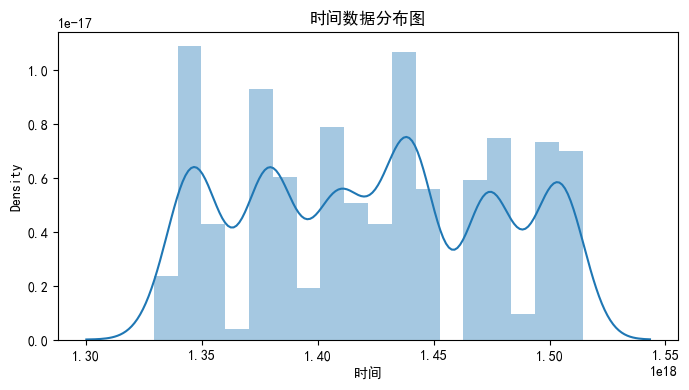

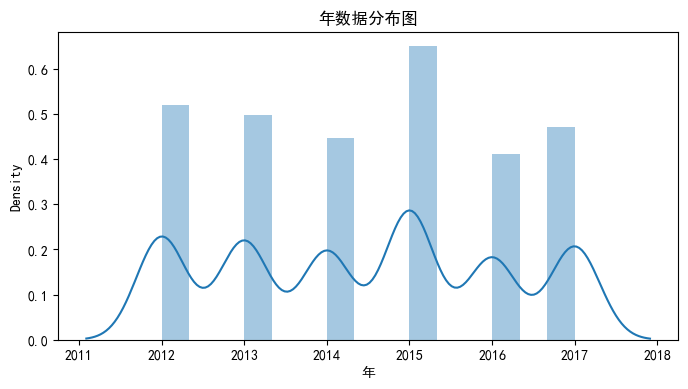

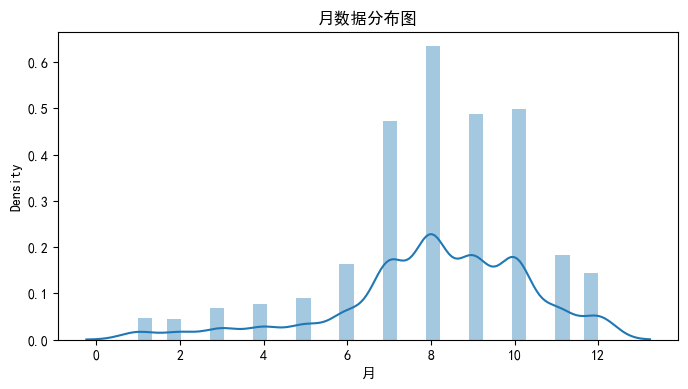

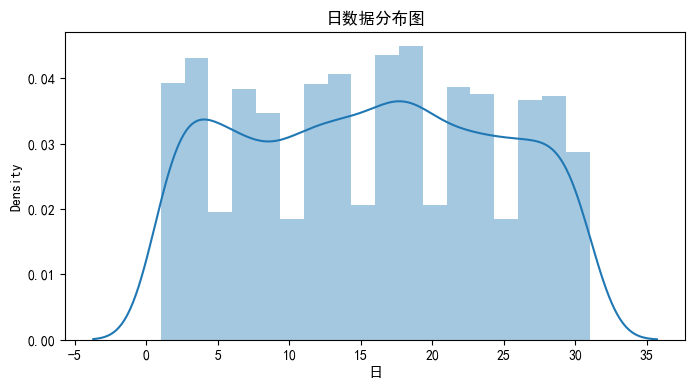

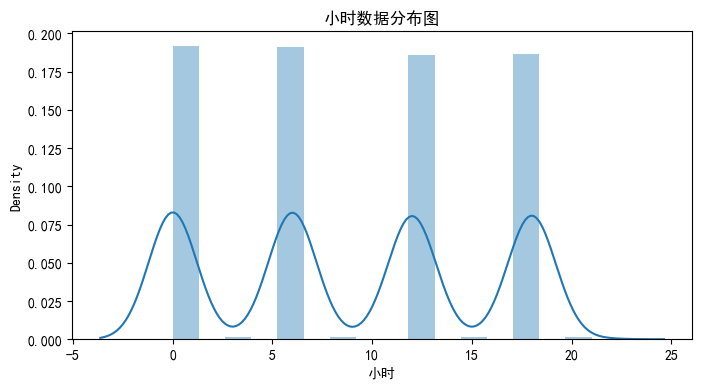

...

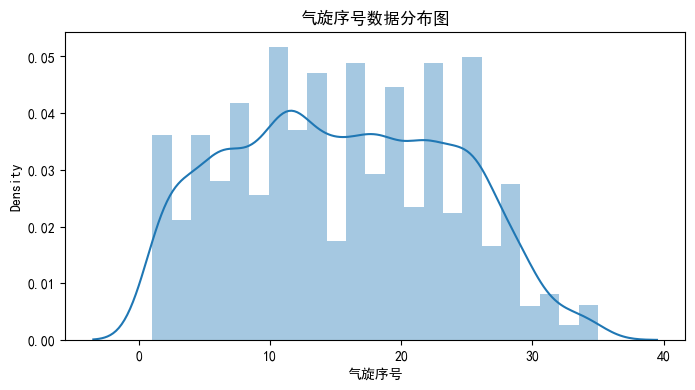

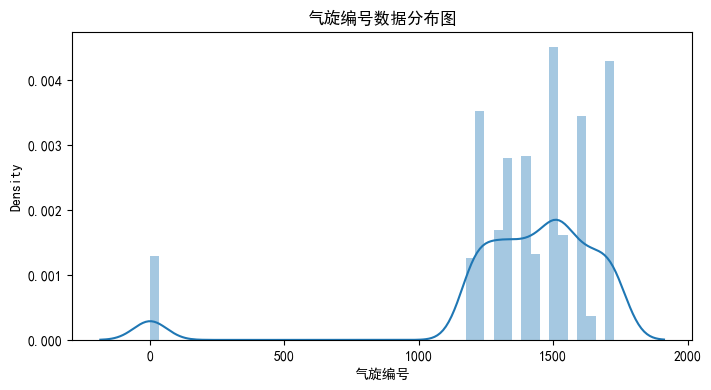

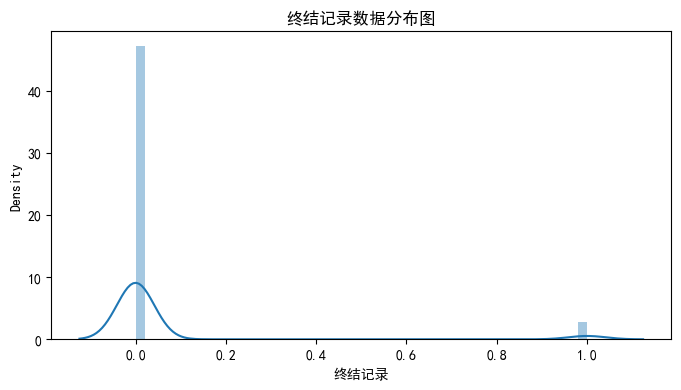

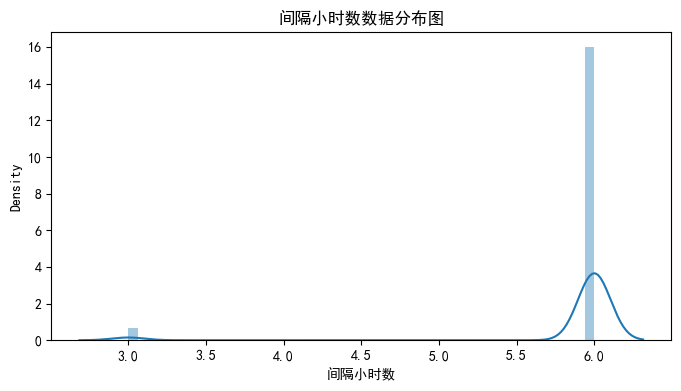

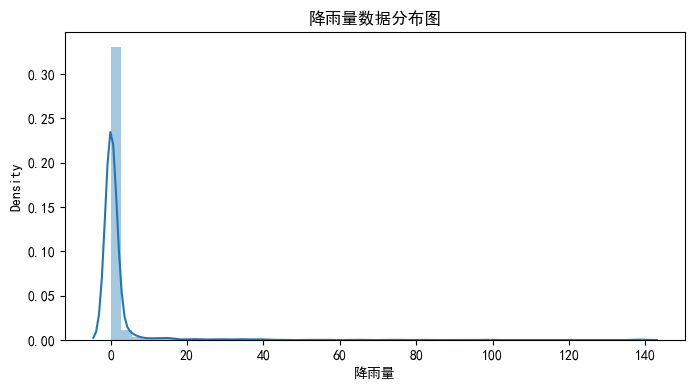

In [26]:
num=len(data.columns)
fig,axes=plt.subplots(nrows=num, ncols=1, figsize=(8, 4 * num))
for i, column in enumerate(data.columns):
    ax = sns.histplot(data[column], kde=True, ax=axes[i])
    ax.set_title(f'{column} 数据分布图')
plt.tight_layout()
plt.show()

# for column in data.columns:
#     fig,axes=plt.subplots(1,1)
#     fig.set_size_inches(8,4)
#     ax=sns.distplot(data[column],hist=True,kde=True,rug=False)
#     ax.set_title(f'{column}数据分布图')
# plt.show()

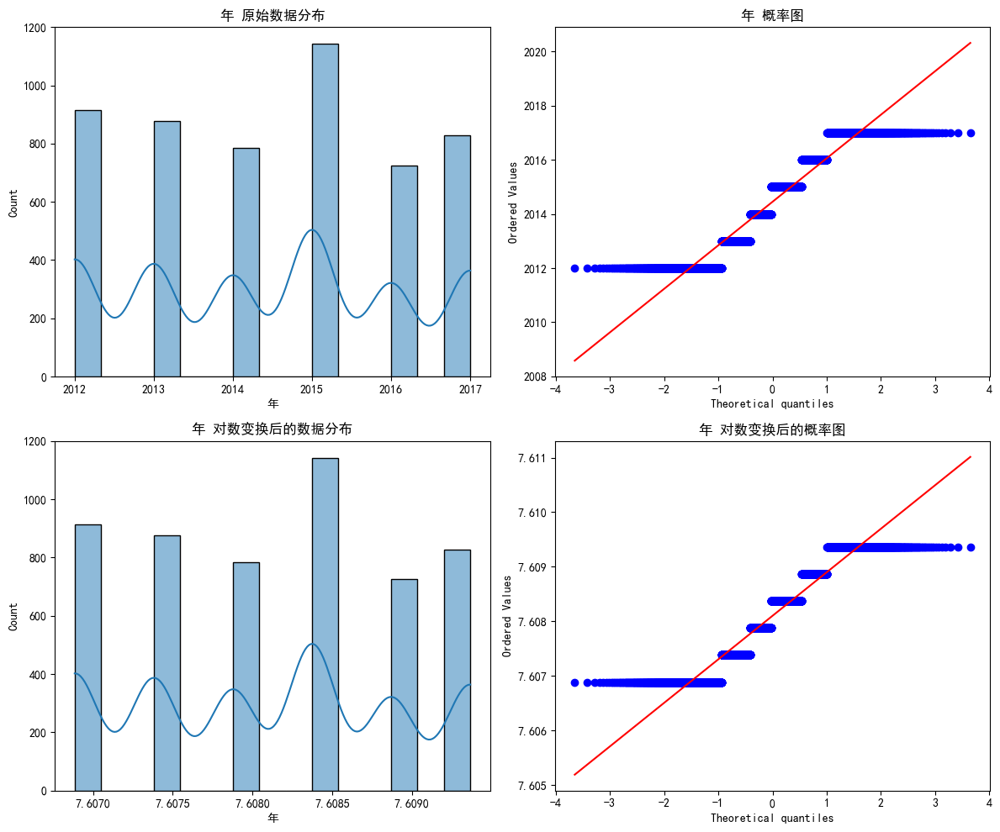

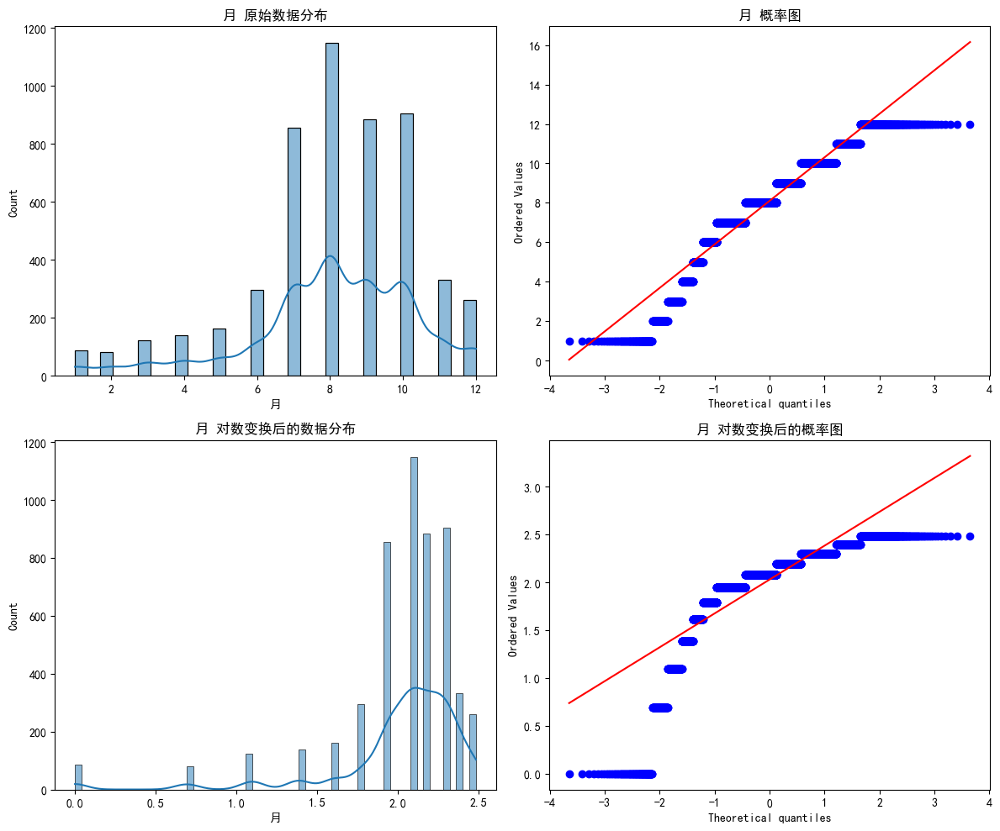

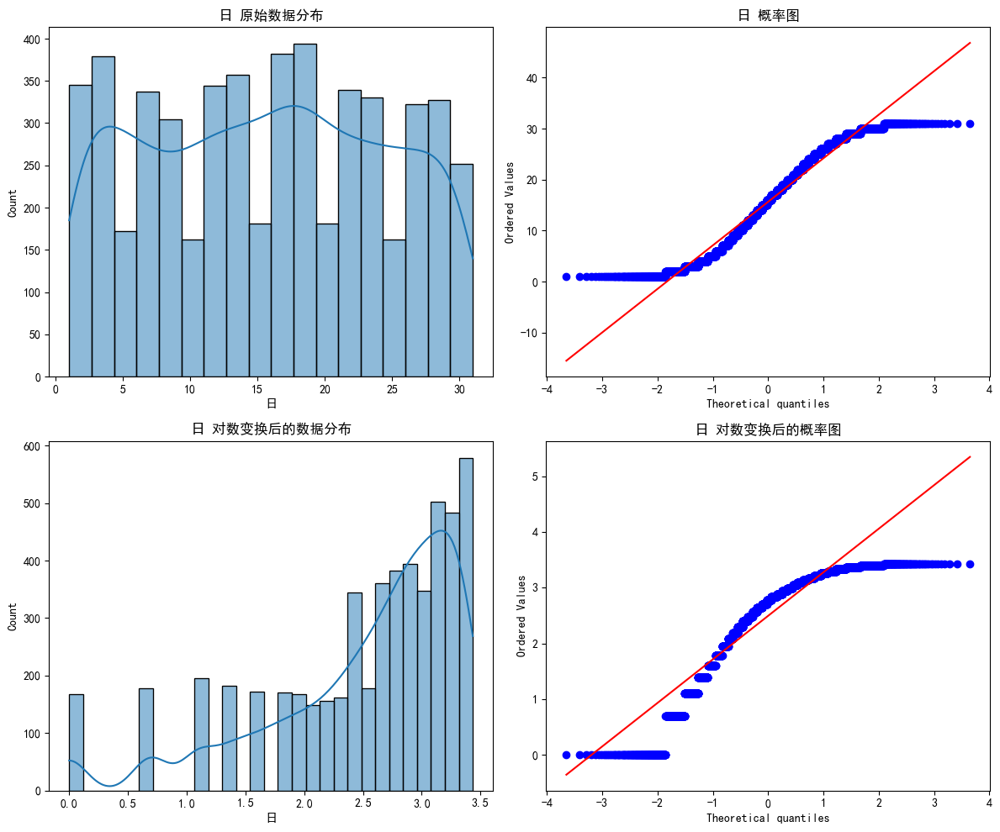

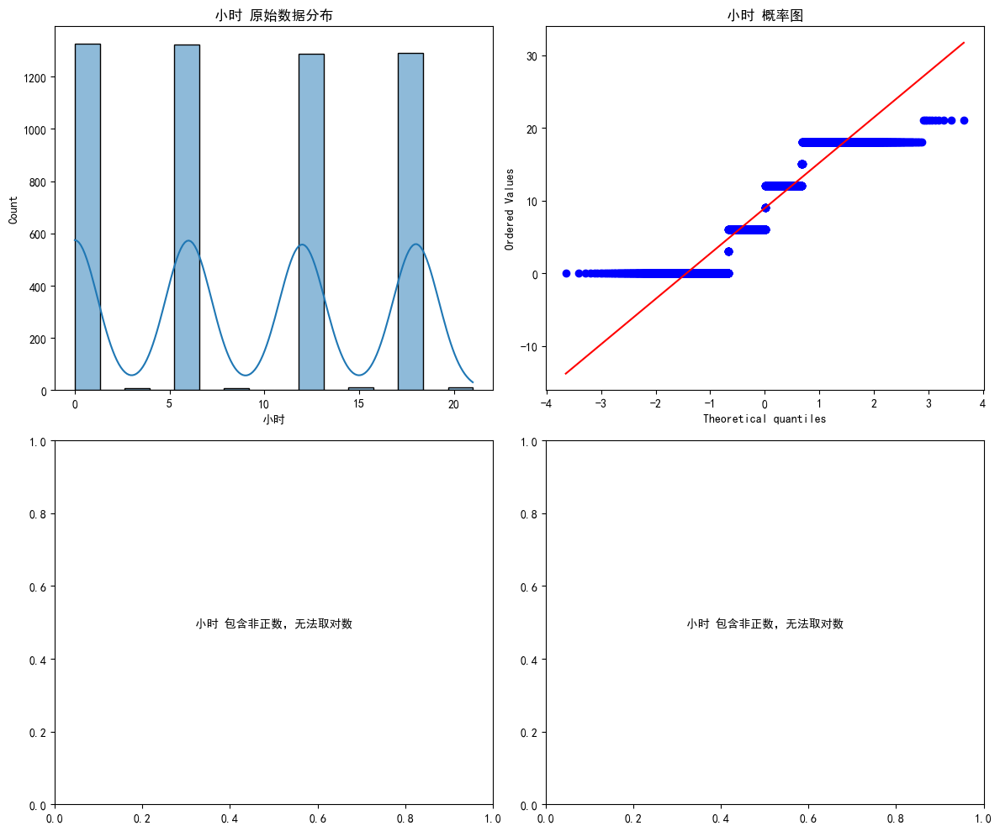

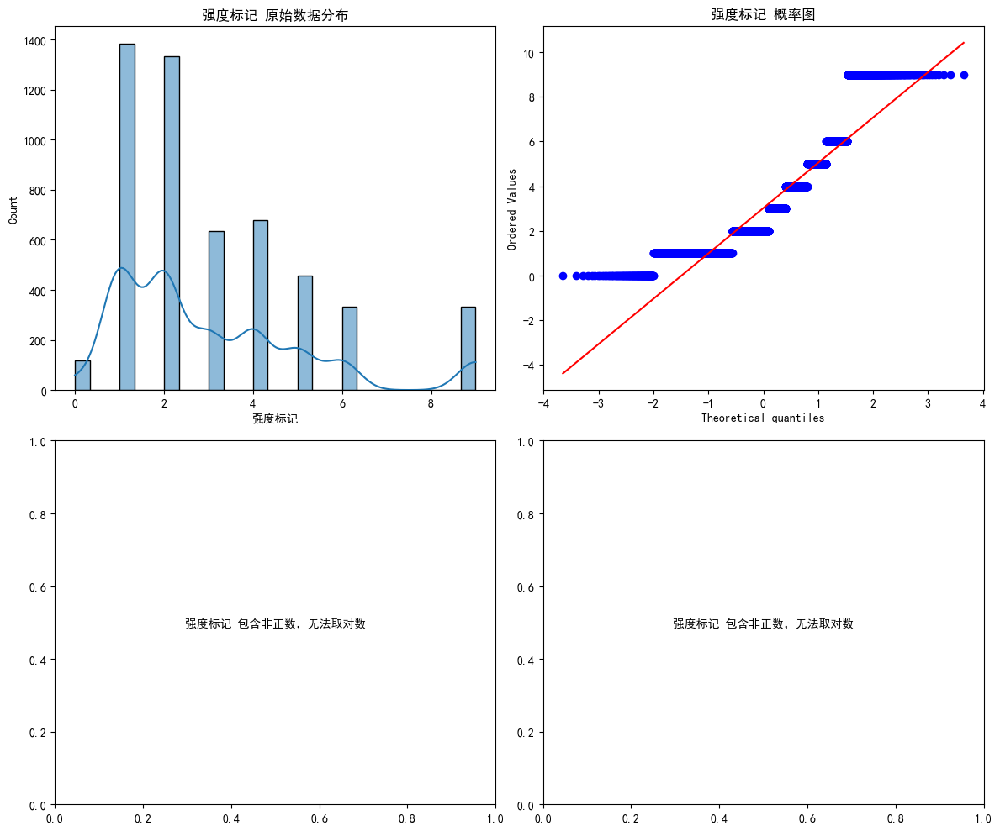

...

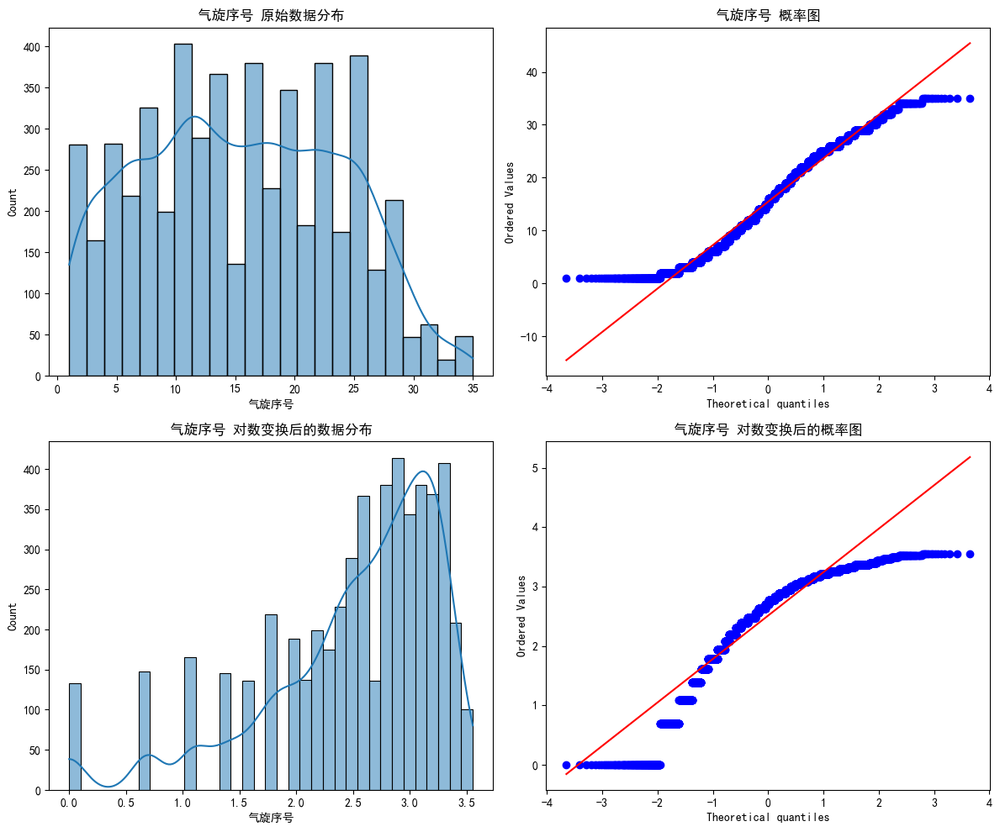

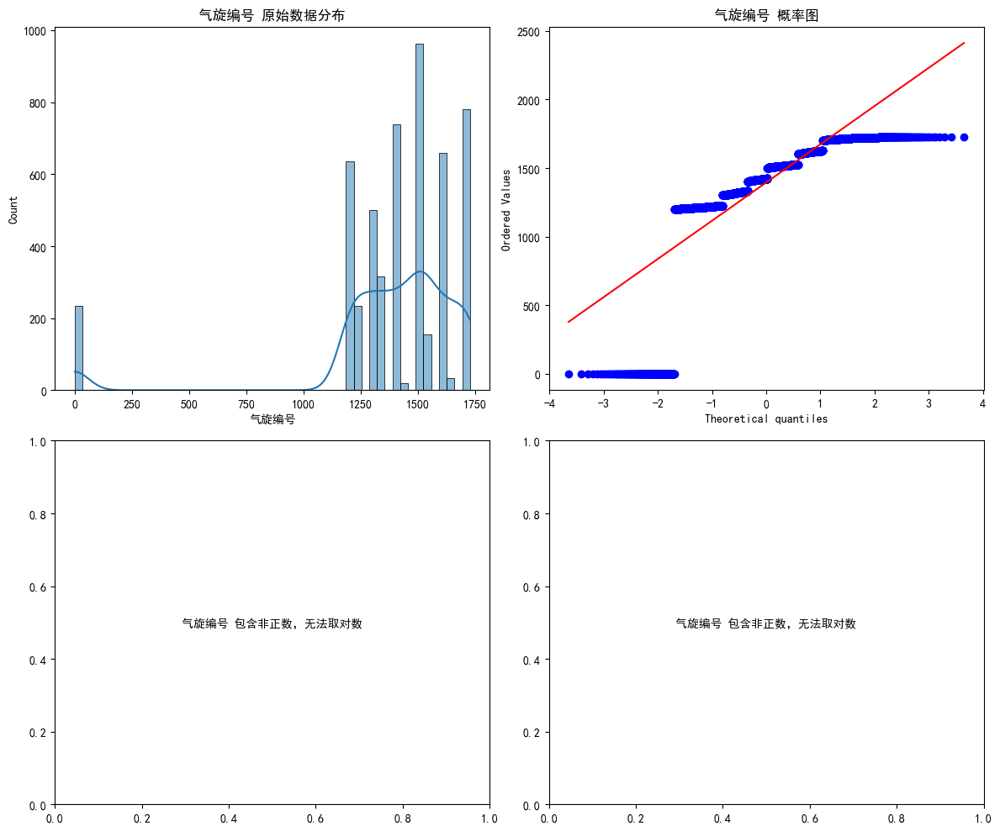

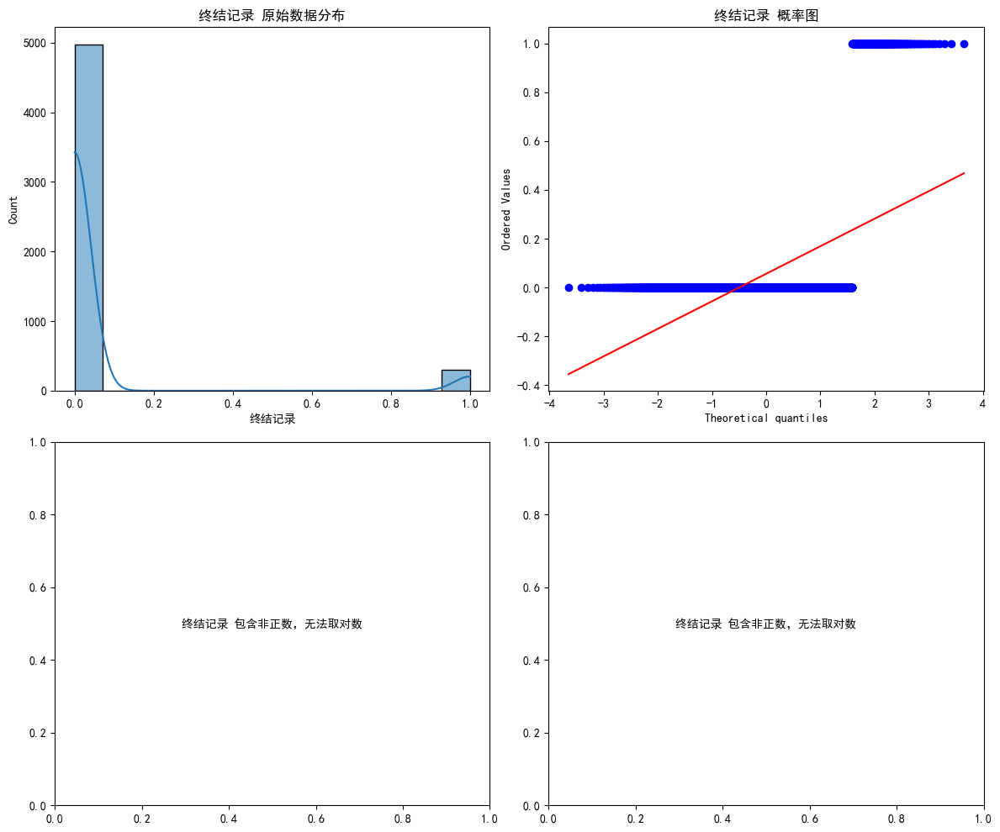

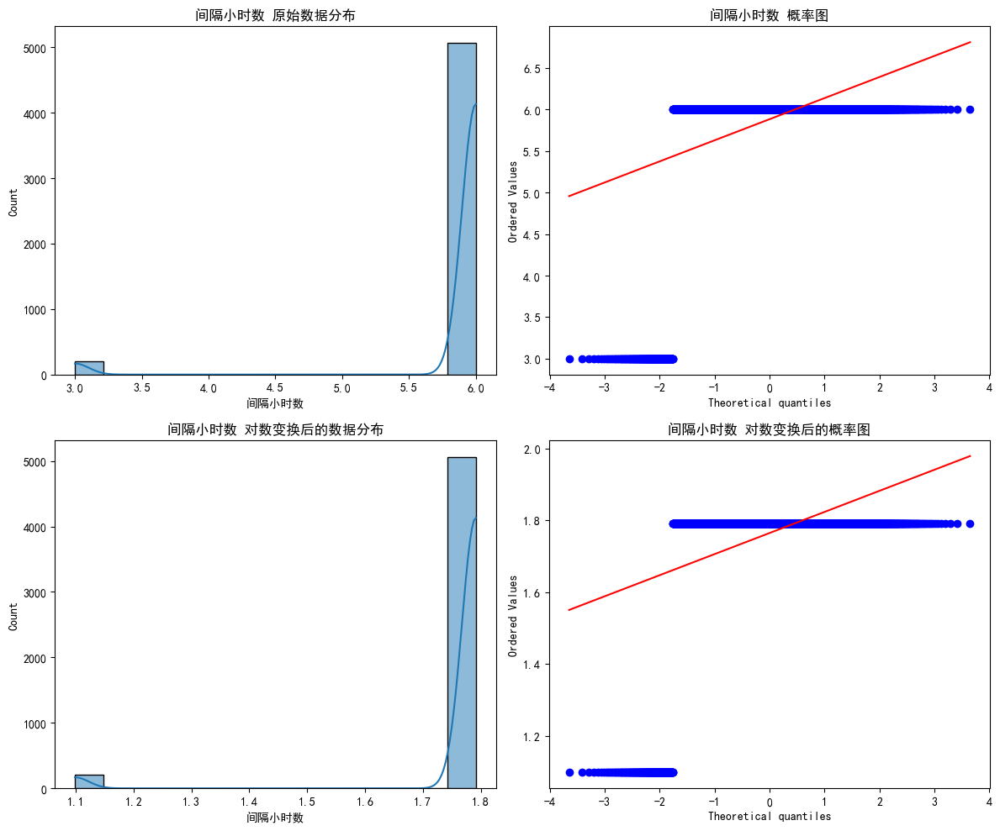

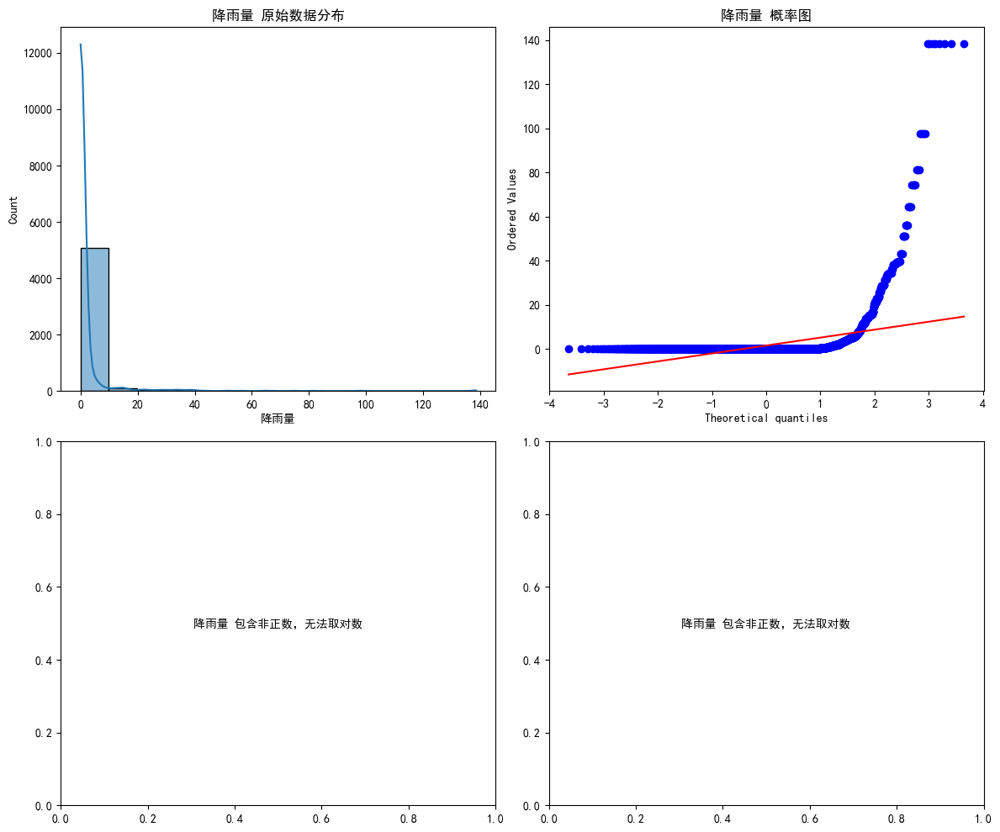

In [30]:
data1 = data.drop('时间', axis=1)

# 循环遍历DataFrame中的每一列并绘制分布图
for column in data1.columns:
    fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(12, 10))
    
    # 绘制原始数据的分布图
    sns.histplot(data1[column], kde=True, ax=axes[0][0])
    axes[0][0].set_title(f'{column} 原始数据分布')
    
    # 绘制概率图
    stats.probplot(data1[column], dist='norm', fit=True, plot=axes[0][1])
    axes[0][1].set_title(f'{column} 概率图')
    
    # 绘制对数变换后的数据分布图
    if all(data1[column] > 0):
        sns.histplot(np.log(data1[column]), kde=True, ax=axes[1][0])
        axes[1][0].set_title(f'{column} 对数变换后的数据分布')
    else:
        axes[1][0].text(0.5, 0.5, f'{column} 包含非正数，无法取对数',
                        ha='center', va='center')
    
    # 绘制对数变换后的概率图
    if all(data1[column] > 0):
        stats.probplot(np.log(data1[column]), dist='norm', fit=True, plot=axes[1][1])
        axes[1][1].set_title(f'{column} 对数变换后的概率图')
    else:
        axes[1][1].text(0.5, 0.5, f'{column} 包含非正数，无法取对数',
                        ha='center', va='center')
    
    plt.tight_layout()
    plt.show()

##### 相关性分析

In [ ]:
df=pd.read_excel('data_merge_precip.xlsx')

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5270 entries, 0 to 5269
Data columns (total 26 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   时间           5270 non-null   object 
 1   year         5270 non-null   int64  
 2   month        5270 non-null   int64  
 3   day          5270 non-null   int64  
 4   小时           5270 non-null   int64  
 5   强度标记         5270 non-null   int64  
 6   纬度           5270 non-null   float64
 7   经度           5270 non-null   float64
 8   压力           5270 non-null   int64  
 9   OWD          5270 non-null   int64  
 10  国际编号         5270 non-null   int64  
 11  气旋序号         5270 non-null   int64  
 12  气旋编号         5270 non-null   int64  
 13  终结记录         5270 non-null   int64  
 14  间隔小时数        5270 non-null   int64  
 15  英文名称         5270 non-null   object 
 16  降雨量          5270 non-null   float64
 17  季节           5270 non-null   object 
 18  降雨量等级        5270 non-null   int64  
 19  form_d

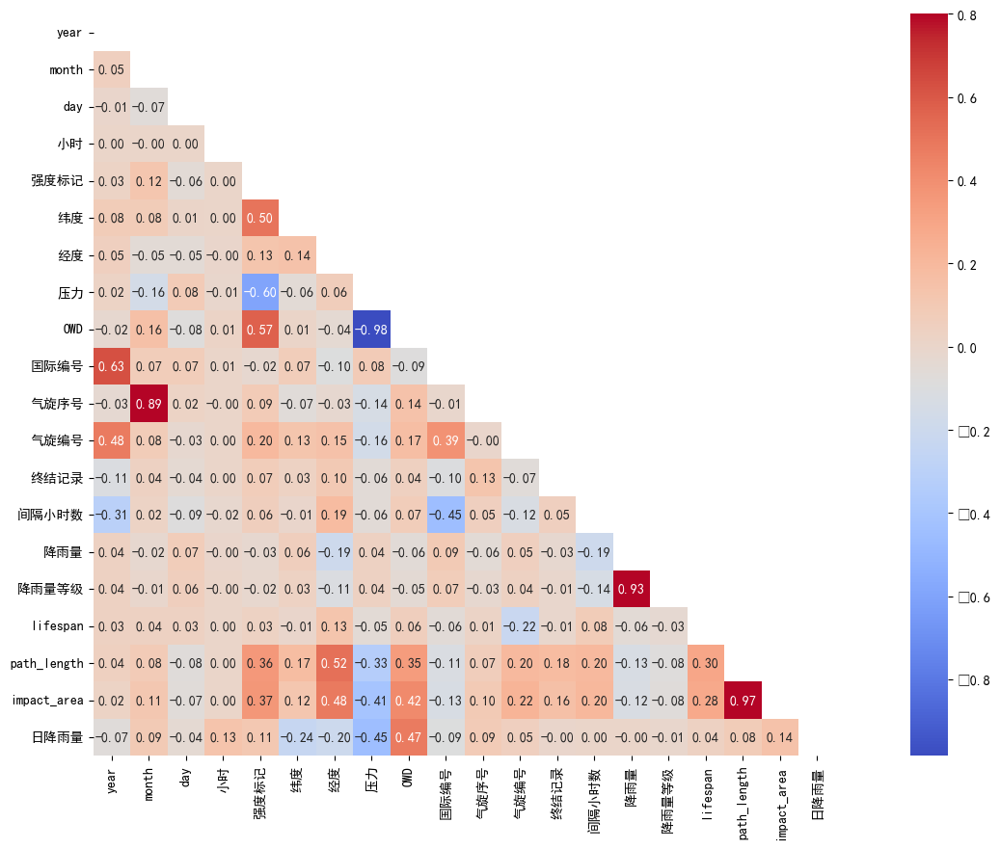

In [15]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# 删除非数值列或转换特定列
df_numeric = df.select_dtypes(include=[np.number])

# 计算相关系数矩阵
corr = df_numeric.corr()

# 创建掩码
mask = np.triu(np.ones_like(corr, dtype=bool))  # 只显示下半三角

# 绘制热图
fig, ax = plt.subplots()
fig.set_size_inches(20, 10)
sns.heatmap(corr, mask=mask, vmax=0.8, square=True, annot=True, fmt=".2f", cmap="coolwarm")

# 显示图形
plt.show()

In [13]:
corr=df.corr()
mask=np.array(corr)
mask[np.tril_indices_from(mask)] = False
fig,ax=plt.subplots()
fig.set_size_inches(20,10)
sns.heatmap(corr, mask=mask, vmax=0.8, square=True,annot=True)

ValueError: could not convert string to float: '2012/2/14 18:00'

##### 散点图矩阵

In [10]:
def cal_corr(x,y,**kwargs):
    coef=np.corrcoef(x,y)[0][1]
    label=r'$\rho$ = '+str(round(coef,3))
    ax=plt.gca()
    ax.annotate(label,xy=(0.2,0.9),xycoords=ax.transAxes,size=10)

def show_summary(x,**kwargs):
    mean=np.mean(x)
    std=np.std(x)
    min_=np.min(x)
    p_25=np.percentile(x,25)
    p_50=np.percentile(x,50)
    p_75=np.percentile(x,75)
    max_=np.max(x)
    label="mean:%s\nstd:%s\nmin_:%s\np_25:%s\np_50:%s\np_75:%s\nmax_:%s"%(str(round(mean,3)),str(round(std,3)),str(round(min_,3)),str(round(p_25,3)),str(round(p_50,3)),str(round(p_75,3)),str(round(max_,3)))
    ax=plt.gca()
    ax.annotate(label,xy=(0.2,0.05),xycoords=ax.transAxes,size=10)

d:\Anaconda\envs\tensorflow\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


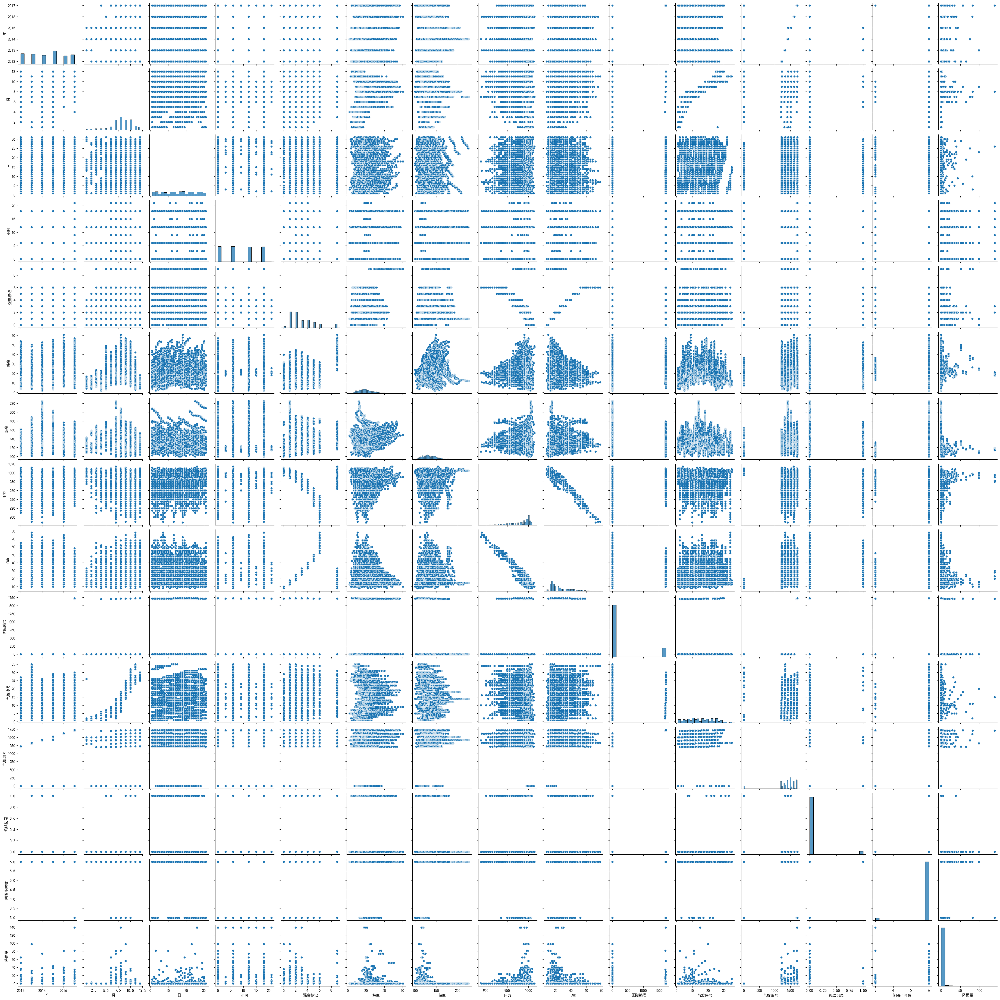

In [41]:
sns.pairplot(data)

d:\Anaconda\envs\tensorflow\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


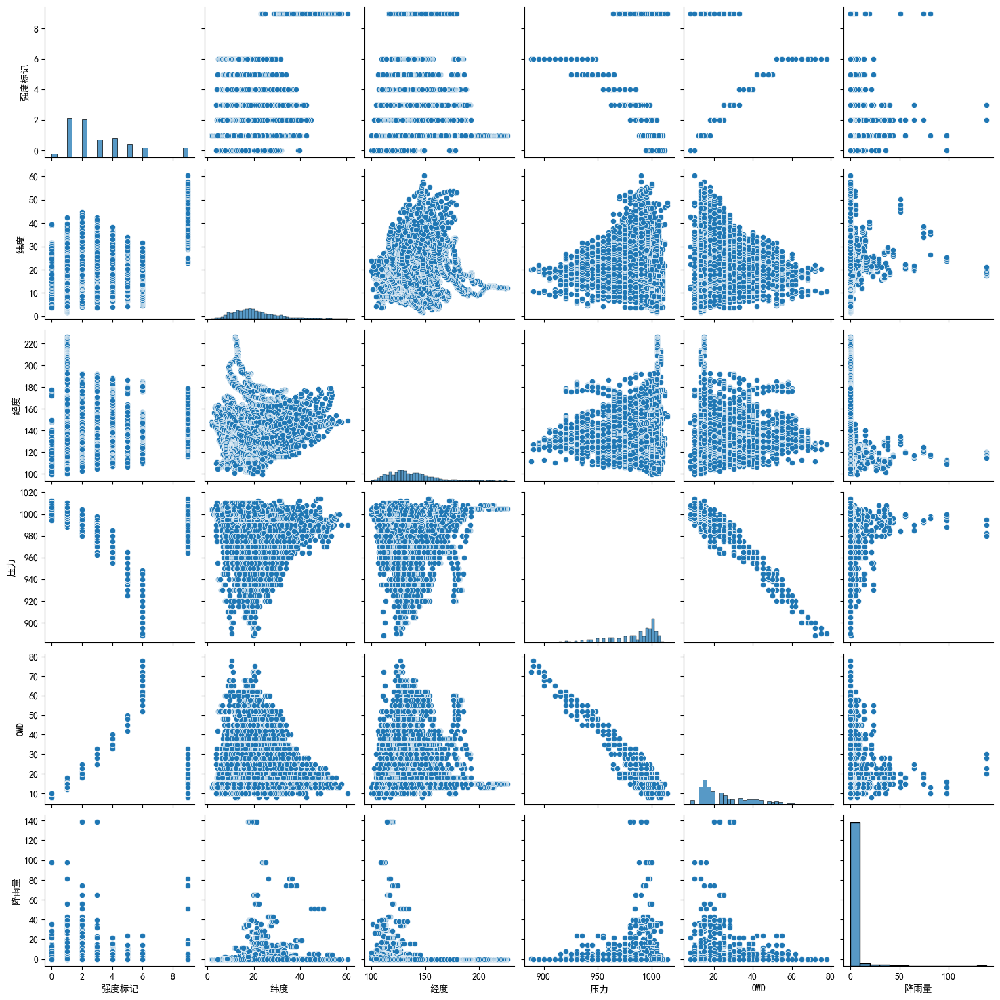

In [46]:
data_pairplot=data[['时间','年','强度标记','纬度','经度','压力','OWD','降雨量']]
sns.pairplot(data_pairplot.drop('年',axis=1))

d:\Anaconda\envs\tensorflow\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


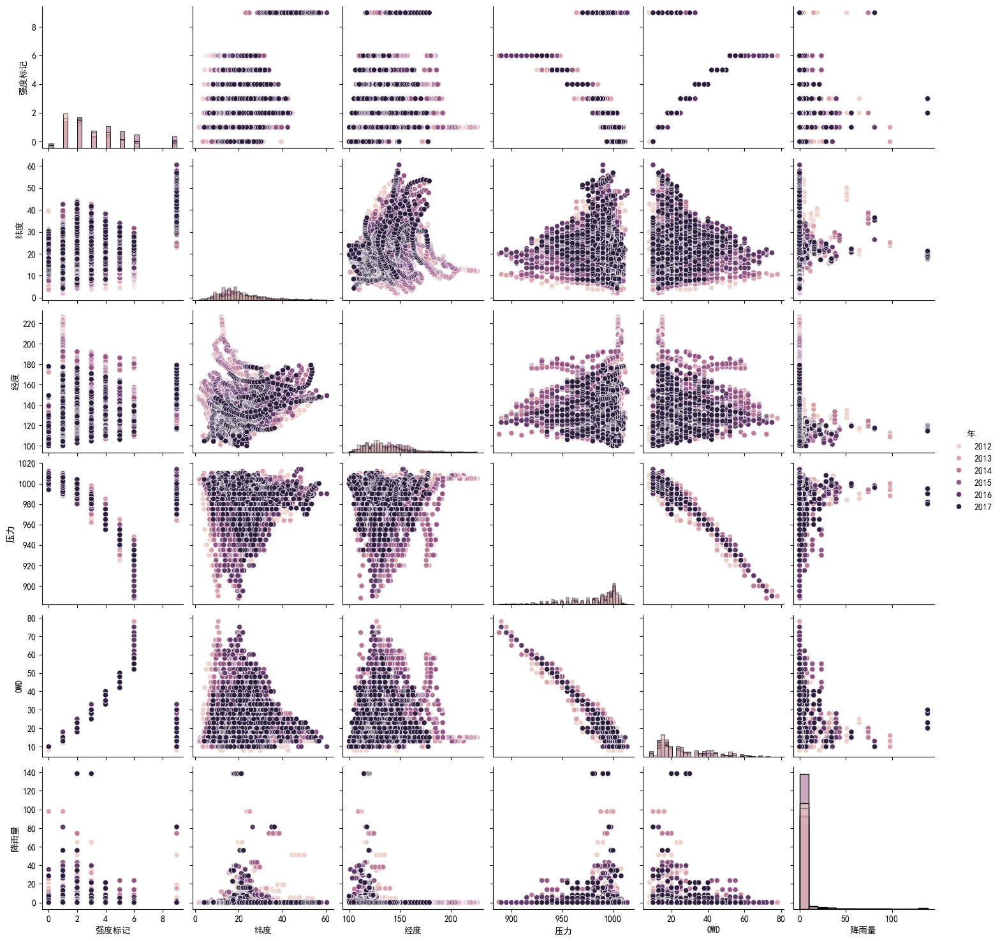

In [47]:
sns.pairplot(data_pairplot,hue='年',diag_kind='hist')

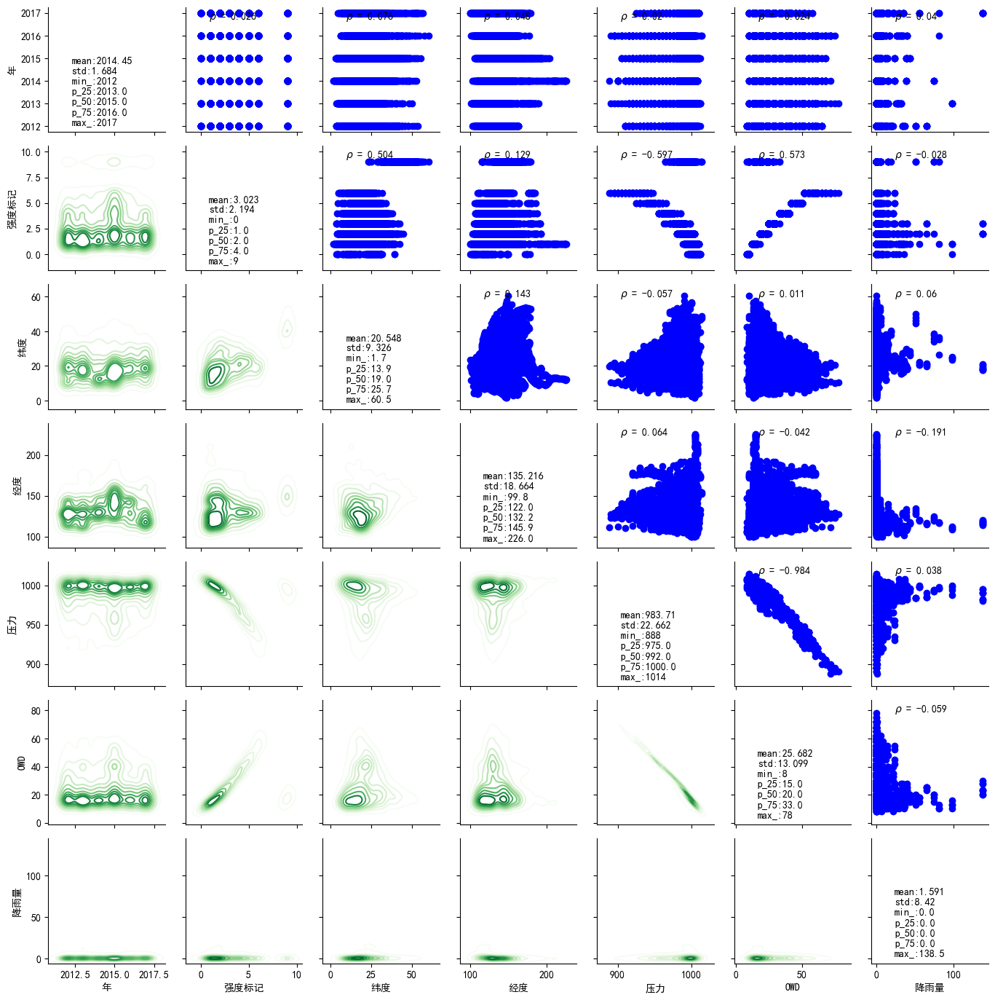

In [53]:
grid=sns.PairGrid(data_pairplot,vars=['年','强度标记','纬度','经度','压力','OWD','降雨量'],height=2)
grid=grid.map_upper(plt.scatter,color='b')
grid=grid.map_upper(cal_corr,color='b')
grid=grid.map_diag(show_summary)
grid=grid.map_lower(sns.kdeplot,cmap='Greens')

##### 时间序列

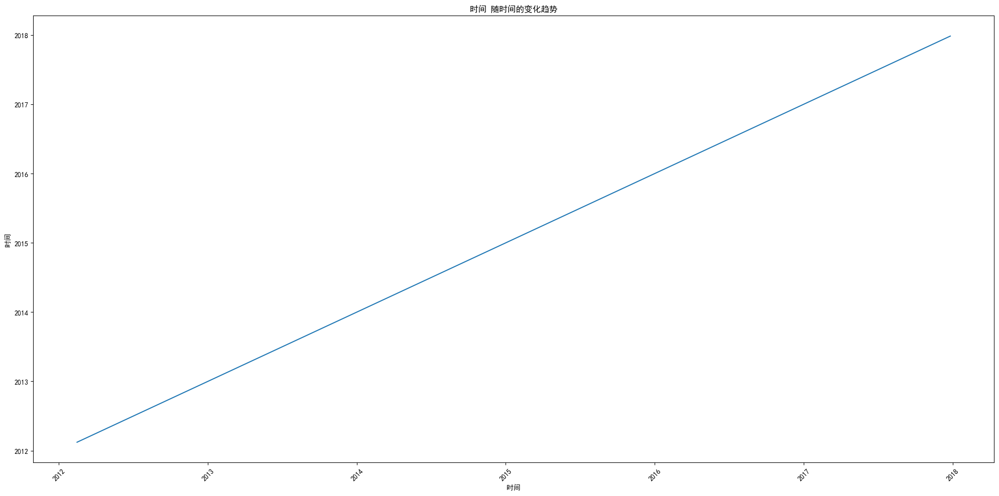

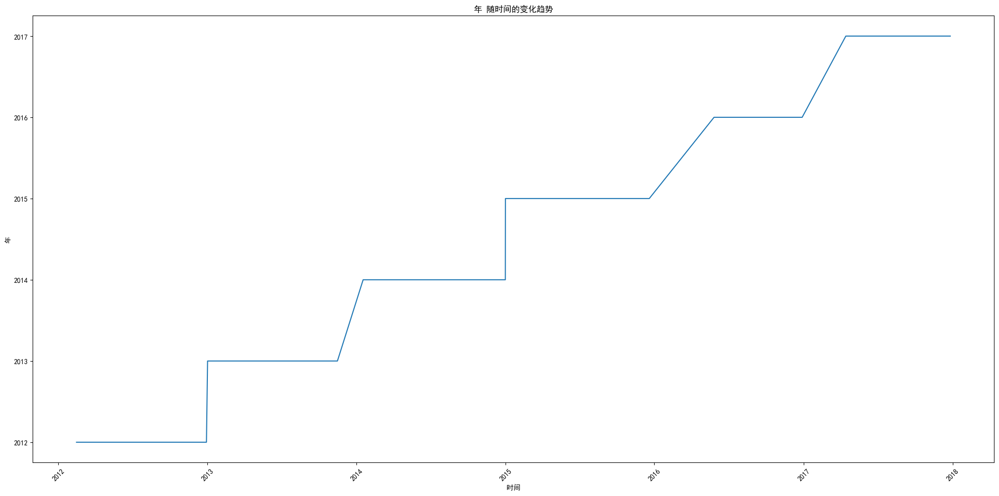

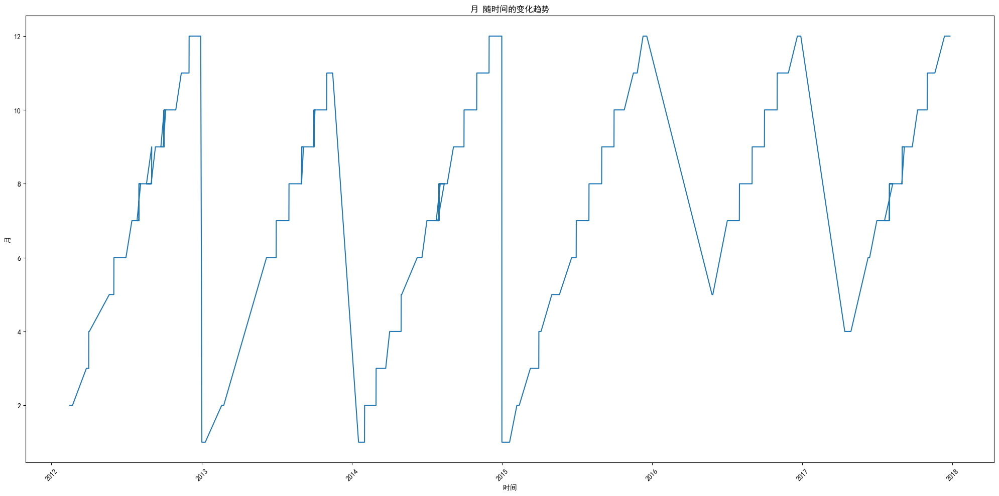

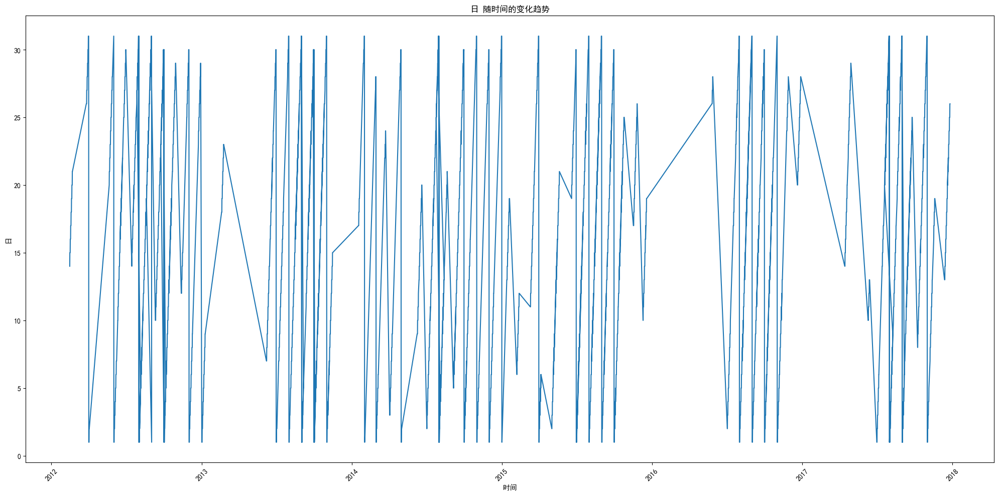

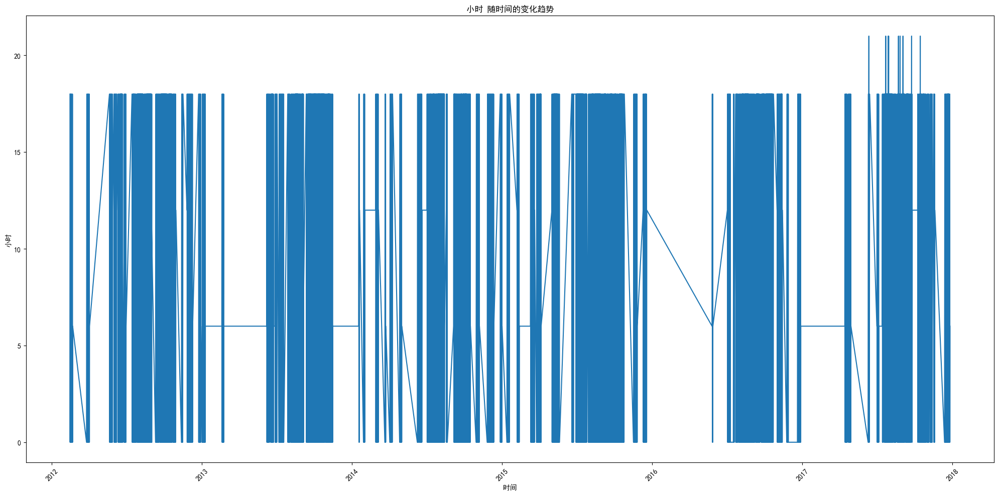

...

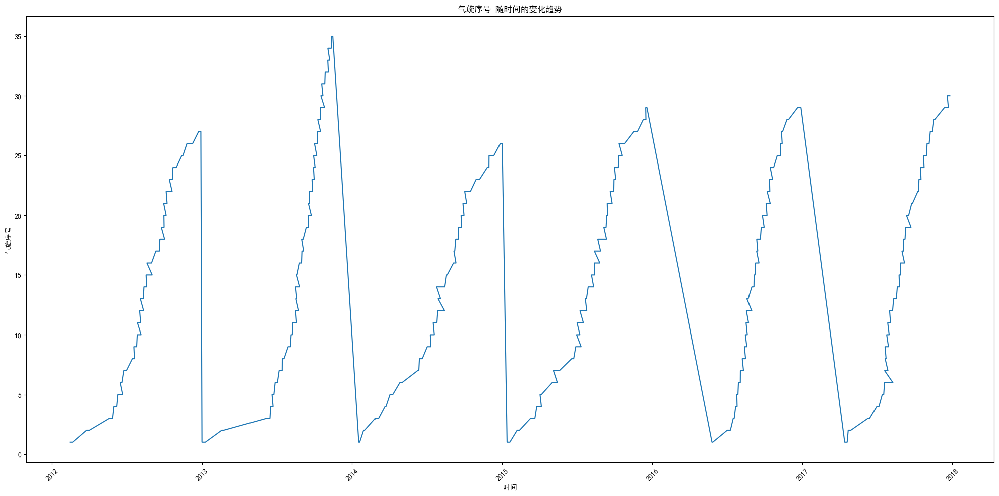

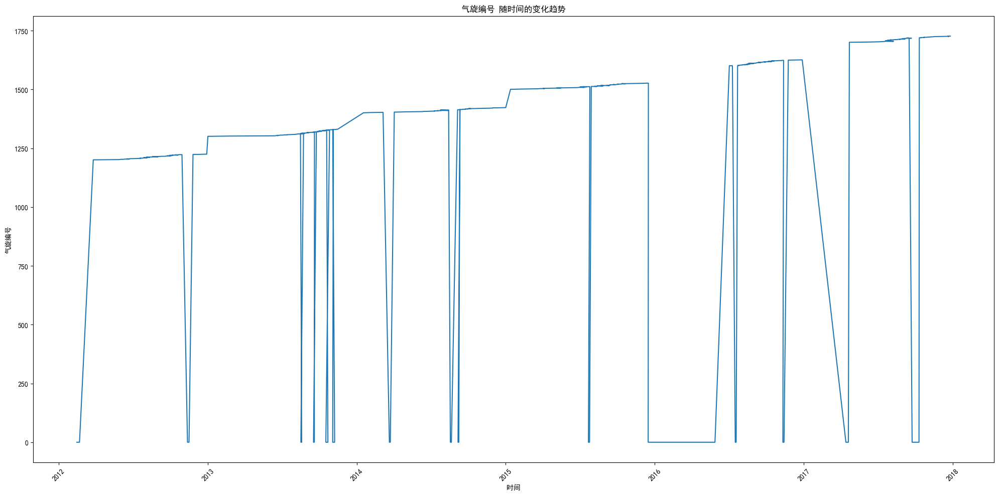

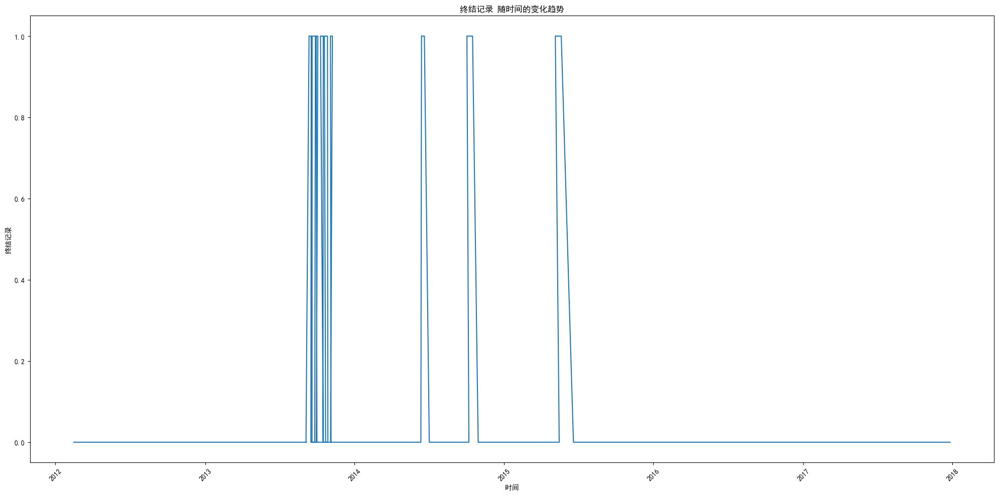

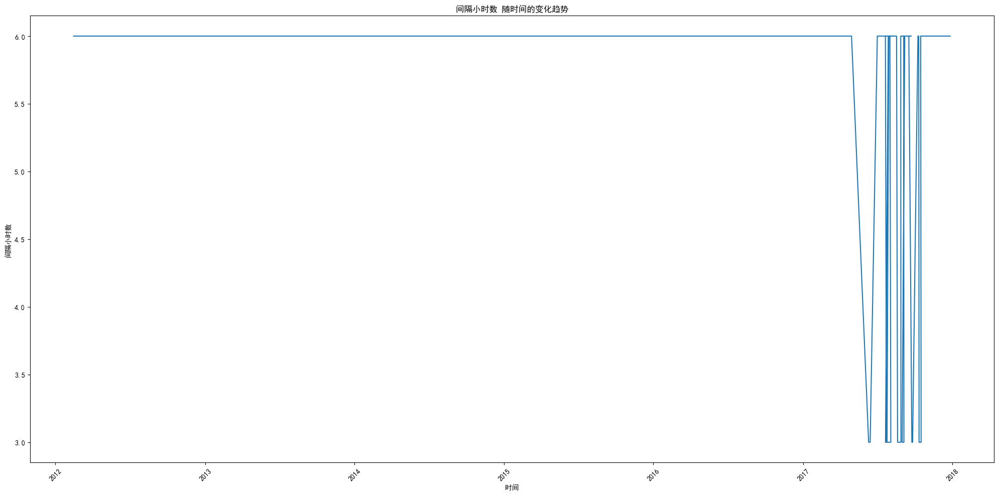

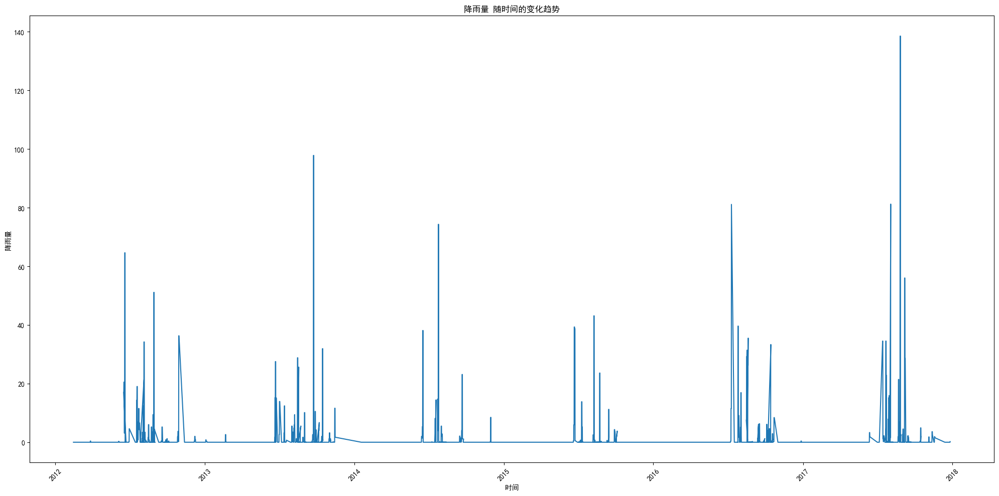

In [54]:
fig,axes=plt.subplots(nrows=num, ncols=1, figsize=(20, 10* num))
for i, column in enumerate(data.columns):
    ax.plot(data['时间'], data[column])
    ax.set_title(f'{column} 随时间的变化趋势')
    ax.set_xlabel('时间')
    ax.set_ylabel(column)
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# for column in data.columns:
#     fig, ax = plt.subplots(figsize=(20, 10))
#     ax.plot(data['时间'], data[column])
#     ax.set_title(f'{column} 随时间的变化趋势')
#     ax.set_xlabel('时间')
#     ax.set_ylabel(column)

#     plt.xticks(rotation=45)

#     plt.tight_layout()
#     plt.show()

#### 2.特征工程

In [14]:
X=data.drop('OWD',axis=1)
X['时间']=X['时间'].astype('int64')
y=data['OWD']

##### 交叉验证

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn import datasets, svm
clf = svm.SVC(kernel='linear', C=1)
scores = cross_val_score(clf, X_train, y_train, cv=5)
print("scores:",scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))
print("\n")

d:\Anaconda\envs\tensorflow\lib\site-packages\sklearn\model_selection\_split.py:725: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


In [55]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5270 entries, 0 to 5269
Data columns (total 16 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   时间      5270 non-null   datetime64[ns]
 1   年       5270 non-null   int64         
 2   月       5270 non-null   int64         
 3   日       5270 non-null   int64         
 4   小时      5270 non-null   int64         
 5   强度标记    5270 non-null   int64         
 6   纬度      5270 non-null   float64       
 7   经度      5270 non-null   float64       
 8   压力      5270 non-null   int64         
 9   OWD     5270 non-null   int64         
 10  国际编号    5270 non-null   int64         
 11  气旋序号    5270 non-null   int64         
 12  气旋编号    5270 non-null   int64         
 13  终结记录    5270 non-null   int64         
 14  间隔小时数   5270 non-null   int64         
 15  降雨量     5270 non-null   float64       
dtypes: datetime64[ns](1), float64(3), int64(12)
memory usage: 658.9 KB


##### Lasso回归

In [72]:
data.sample(frac=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# for i in range(10):
#     alpha=i/10
#     lasso=Lasso(alpha)
#     y_pred_lasso=lasso.fit(X_train,y_train).predict(X_test)
#     r2_score_lasso=r2_score(y_test,y_pred_lasso)
#     print(lasso)
#     print('R^2=%f'%r2_score_lasso)
alpha=0.5#R^2=0.050450
lasso=Lasso(alpha,)
y_pred_lasso=lasso.fit(X_train,y_train).predict(X_test)
r2_score_lasso=r2_score(y_test,y_pred_lasso)
print(lasso)
print('R^2=%f'%r2_score_lasso)

Lasso(alpha=0.5)
R^2=0.050450


In [80]:
data.sample(frac=1)
X=data.drop('OWD',axis=1)
X['时间']=X['时间'].astype('int64')
y=data['OWD']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# for i in range(10):
#     alpha=i/10
#     lasso=Lasso(alpha)
#     y_pred_lasso=lasso.fit(X_train,y_train).predict(X_test)
#     r2_score_lasso=r2_score(y_test,y_pred_lasso)
#     print(lasso)
#     print('R^2=%f'%r2_score_lasso)
alpha=0.2#R^2=0.972408
lasso=Lasso(alpha,)
y_pred_lasso=lasso.fit(X_train,y_train).predict(X_test)
r2_score_lasso=r2_score(y_test,y_pred_lasso)
print(lasso)
print('R^2=%f'%r2_score_lasso)

Lasso(alpha=0.2)
R^2=0.972408


##### Elastic-Net Regression

In [15]:
# 标准化
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error, r2_score

scaler = StandardScaler()
X_scaler = scaler.fit_transform(X)
# 划分数据集
X_train, X_test, y_train, y_test = train_test_split(X_scaler, y, test_size=0.2, random_state=42)

param_grid = {
    'alpha': [0.001, 0.01, 0.1, 1, 10, 100],
    'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9]
}

for alpha in range(10):
    alpha = alpha / 10
    elasticnet = ElasticNet(alpha=alpha, l1_ratio=0.5, fit_intercept=True, random_state=42)
    grid_search = GridSearchCV(elasticnet, param_grid, cv=5, scoring='neg_mean_squared_error', return_train_score=True)
    grid_search.fit(X_train, y_train)
    print('best param: ' + str(grid_search.best_params_))
    best_model = grid_search.best_estimator_

    train_predictions = best_model.predict(X_train)
    test_predictions = best_model.predict(X_test)
    train_rmse = np.sqrt(mean_squared_error(y_train, train_predictions))
    test_rmse = np.sqrt(mean_squared_error(y_test, test_predictions))
    train_r2 = r2_score(y_train, train_predictions)
    test_r2 = r2_score(y_test, test_predictions)
    print(f"训练集 RMSE: {train_rmse:.4f}, R2: {train_r2:.4f}")
    print(f"测试集 RMSE: {test_rmse:.4f}, R2: {test_r2:.4f}")

best param: {'alpha': 0.01, 'l1_ratio': 0.9}
训练集 RMSE: 2.2155, R2: 0.9714
测试集 RMSE: 2.1623, R2: 0.9727
best param: {'alpha': 0.01, 'l1_ratio': 0.9}
训练集 RMSE: 2.2155, R2: 0.9714
测试集 RMSE: 2.1623, R2: 0.9727
best param: {'alpha': 0.01, 'l1_ratio': 0.9}
训练集 RMSE: 2.2155, R2: 0.9714
测试集 RMSE: 2.1623, R2: 0.9727
best param: {'alpha': 0.01, 'l1_ratio': 0.9}
训练集 RMSE: 2.2155, R2: 0.9714
测试集 RMSE: 2.1623, R2: 0.9727
best param: {'alpha': 0.01, 'l1_ratio': 0.9}
训练集 RMSE: 2.2155, R2: 0.9714
测试集 RMSE: 2.1623, R2: 0.9727
best param: {'alpha': 0.01, 'l1_ratio': 0.9}
训练集 RMSE: 2.2155, R2: 0.9714
测试集 RMSE: 2.1623, R2: 0.9727
best param: {'alpha': 0.01, 'l1_ratio': 0.9}
训练集 RMSE: 2.2155, R2: 0.9714
测试集 RMSE: 2.1623, R2: 0.9727
best param: {'alpha': 0.01, 'l1_ratio': 0.9}
训练集 RMSE: 2.2155, R2: 0.9714
测试集 RMSE: 2.1623, R2: 0.9727
best param: {'alpha': 0.01, 'l1_ratio': 0.9}
训练集 RMSE: 2.2155, R2: 0.9714
测试集 RMSE: 2.1623, R2: 0.9727
best param: {'alpha': 0.01, 'l1_ratio': 0.9}
训练集 RMSE: 2.2155, R2: 0.9714

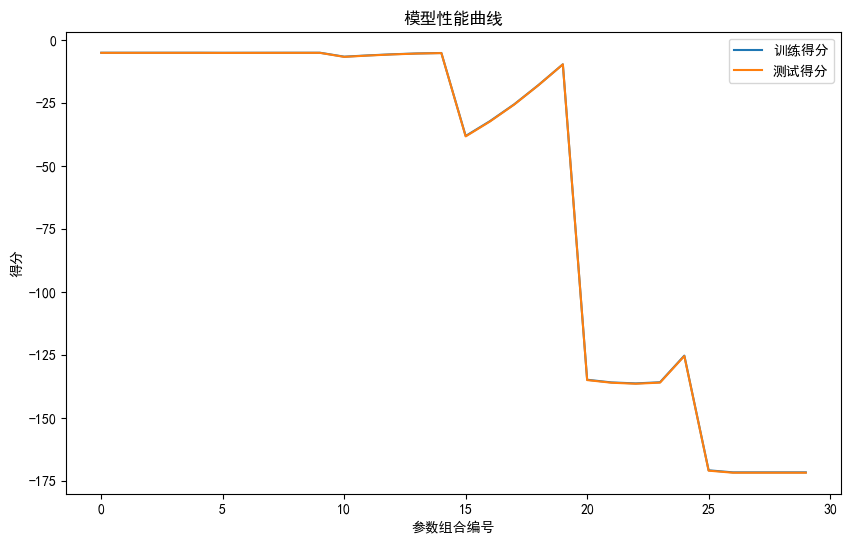

In [18]:
#绘制模型的训练曲线
cv_results = grid_search.cv_results_
mean_train_score = cv_results['mean_train_score']
mean_test_score = cv_results['mean_test_score']

plt.figure(figsize=(10, 6))
plt.plot(mean_train_score, label='训练得分')
plt.plot(mean_test_score, label='测试得分')
plt.title('模型性能曲线')
plt.xlabel('参数组合编号')
plt.ylabel('得分')
plt.legend()
plt.show()


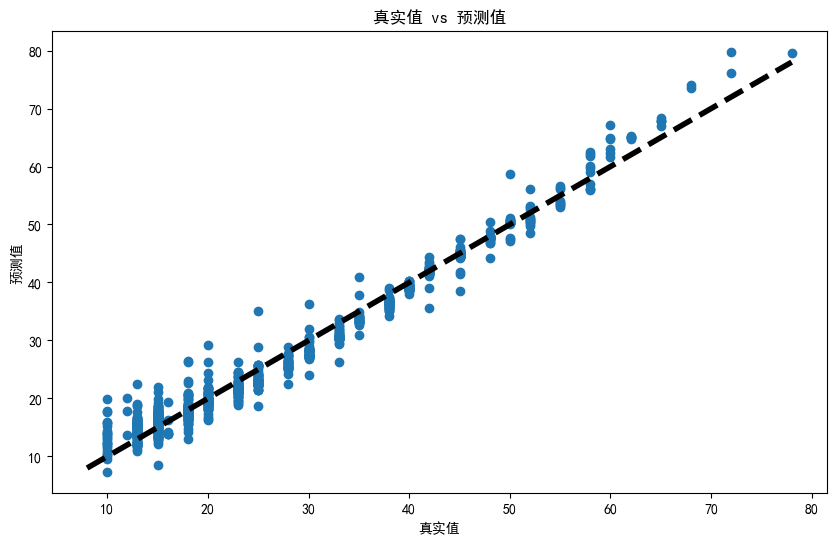

In [19]:
#可视化真实值与预测值的关系
plt.figure(figsize=(10, 6))
plt.scatter(y_test, test_predictions)
plt.xlabel('真实值')
plt.ylabel('预测值')
plt.title('真实值 vs 预测值')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
plt.show()


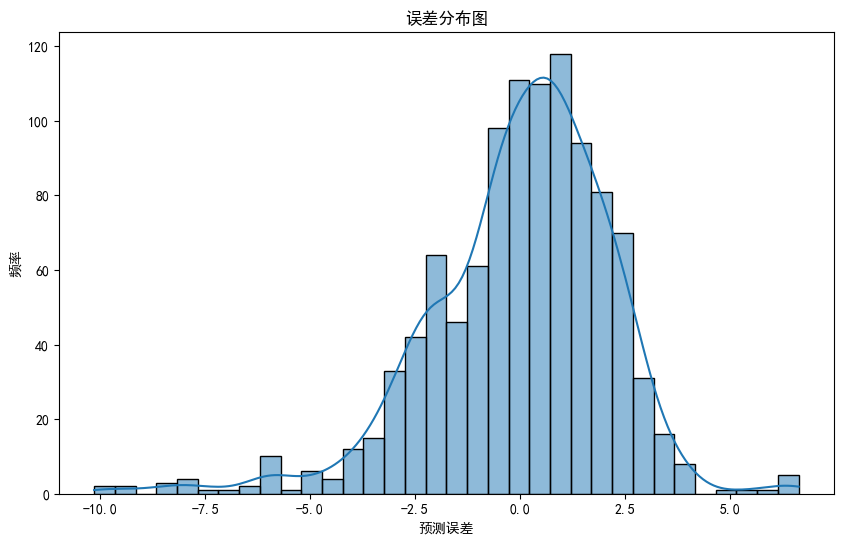

In [20]:
#绘制误差分布图
errors = y_test - test_predictions
plt.figure(figsize=(10, 6))
sns.histplot(errors, kde=True)
plt.xlabel('预测误差')
plt.ylabel('频率')
plt.title('误差分布图')
plt.show()